# **Generate CSV dataset file**

**Need to use a V100 16/32GB GPU**

In [1]:
# Allow reloading of libraries without restarting the kernel
%load_ext autoreload
%autoreload 2

In [2]:
import os
import re
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path

from lynx_id.utils.preprocess.utils import flatten_bbox, get_no_and_multiple_bbox, separate_single_multiple_df, plot_images_conf, absolute_coordinates_bbox
from lynx_id.utils.megadetector.utils import crop_bbox

from detection.run_detector_batch import load_and_run_detector_batch, write_results_to_file
from md_utils import path_utils

os.environ['WANDB_DISABLED'] = 'true'  # for megadetector

%matplotlib inline

**Warning: after 90 days of non-use, files are deleted from the SCRATCH.**

In [3]:
DATASET = Path("/gpfsscratch/rech/ads/commun/datasets/extracted/")

## **Norwegian dataset**

In [41]:
NORWAY_DATASET_PATH = DATASET / "norway" / "Zoo data_Thorsen"

In [51]:
dataset_dict = {
    "filepath": [],
    "lynx_id": [],
}

In [52]:
translation = {
    "Vinter": "Winter",
    "Sommer": "Summer",
    "Dag": "Day",
    "IR": "IR",
    "LED": "Dark",
    "Venstre": "Left",
    "Høyre": "Right"
}  # if one day there is a need for other elements

def parse_filename(filename):
    parts = filename.split("/norway/Zoo data_Thorsen/")[1:][0].split("/")
    
    return {"id_lynx": parts[0]}

In [53]:
for current_directory, _, files in os.walk(NORWAY_DATASET_PATH):
    for file in files:
        absolute_path = os.path.abspath(os.path.join(current_directory, file))
        if re.compile(r'\.(jpg|jpeg|png)$', re.IGNORECASE).search(absolute_path):

            try:
                parsed = parse_filename(absolute_path)
                dataset_dict["filepath"].append(absolute_path)
                dataset_dict["lynx_id"].append(parsed["id_lynx"])

            except:
                print(f"Error with: {absolute_path}")

In [54]:
df_norway = pd.DataFrame(dataset_dict)
df_norway

,filepath,lynx_id
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1
...,...,...
11502,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 6
11503,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 6
11504,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 6
11505,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 6


#### Bounding box detection

In [55]:
norway_output_megadetector = DATASET / "bbox_norway.json"  # WARNING: change filename if needed

In [56]:
image_filenames = path_utils.find_images(NORWAY_DATASET_PATH, recursive=True)
image_filenames=[file for file in image_filenames]
len(image_filenames)

11507

In [57]:
df_norway['filepath'].nunique()

11507

In [58]:
results = load_and_run_detector_batch(
    model_file='/gpfswork/rech/ads/commun/megadetector/md_v5a.0.0.pt', 
    image_file_names=image_filenames, 
    quiet=True, 
    include_image_size=True, 
    confidence_threshold=0.5
)

output = write_results_to_file(results, norway_output_megadetector)

PyTorch reports 1 available CUDA devices
GPU available: True


Fusing layers... 
Fusing layers... 
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs


Sending model to GPU
Loaded model in 1.97 seconds
Loaded model in 1.97 seconds


100%|██████████| 11507/11507 [24:09<00:00,  7.94it/s] 


Output file saved at /gpfsscratch/rech/ads/commun/datasets/extracted/bbox_norway.json


In [62]:
with open(norway_output_megadetector, 'r') as f:
    bbox_norway = json.load(f)

Some images may not have bounding boxes found.

In [63]:
no_bbox_norway, multiple_bbox_norway = get_no_and_multiple_bbox(bbox_norway)

1437 images have no bounding boxes detected.
388 images have several bounding boxes detected.
Total: 11507 images.


Sometimes the length is not identical between `bbox_norway` and `df_norway`. To do this, we look for differences.

In [65]:
all_file_megadetector = []
for img in bbox_norway['images']:
    all_file_megadetector.append(img['file']) 
print(len(all_file_megadetector))

all_file_df_norway = df_norway['filepath'].to_list()
print(len(all_file_df_norway))

11507
11507


In [66]:
set(all_file_megadetector) - set(all_file_df_norway)

set()

In [68]:
set(all_file_df_norway) - set(all_file_megadetector)

set()

Back to bbox...
Absolute coordinates of the bounding box (x, y, width and height) based on the image dimensions

In [69]:
df_bbox_norway = flatten_bbox(bbox_norway, add_image_without_bbox=False, verbose=False)
df_bbox_norway = absolute_coordinates_bbox(df_bbox_norway)

df_bbox_norway

,file,im_width,im_height,category,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.968,375.808000,783.9744,722.94400,421.9392
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.953,897.843200,837.8880,693.86240,407.9616
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.943,1344.921600,919.9104,615.83360,324.8640
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.968,57.999360,704.8704,758.98880,442.9824
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.952,680.960000,756.9408,663.96160,433.9200
...,...,...,...,...,...,...,...,...,...
10562,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.933,448.921600,687.9744,834.96960,457.8816
10563,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.935,0.000000,683.9808,901.93920,465.8688
10564,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.905,0.999834,758.9376,938.80320,354.9696
10565,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.812,0.999834,952.9344,168.98048,165.8880


#### 10 images cropped with the least confidence are displayed

Only images with a single bounding box are displayed.

In [70]:
df_bbox_norway_single_detection, df_bbox_norway_multiple_detections = separate_single_multiple_df(df_bbox_norway)

print(len(df_bbox_norway_single_detection))
print(len(df_bbox_norway_multiple_detections))

9682
885


In [71]:
%matplotlib inline

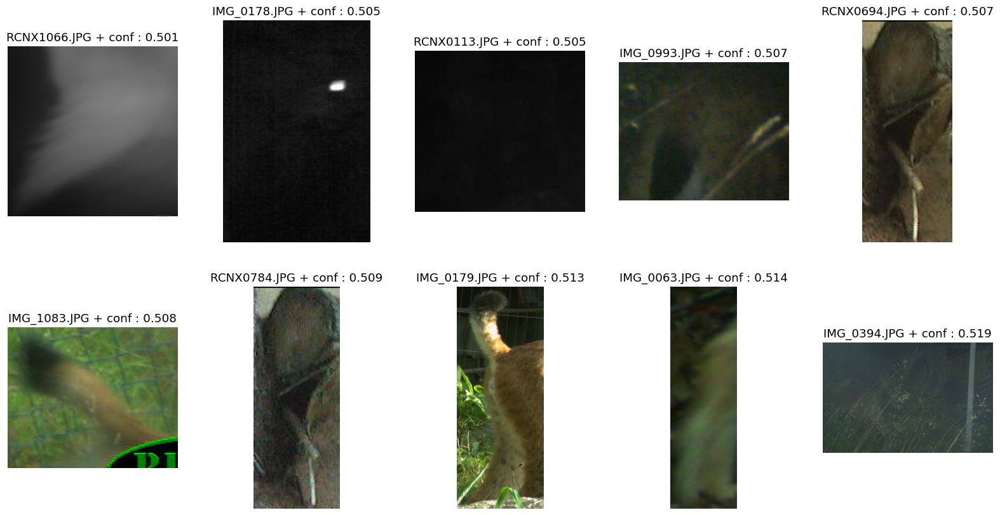

In [72]:
plot_images_conf(df_bbox_norway_single_detection, by="smallest")

#### 10 images cropped with the largest confidence are displayed

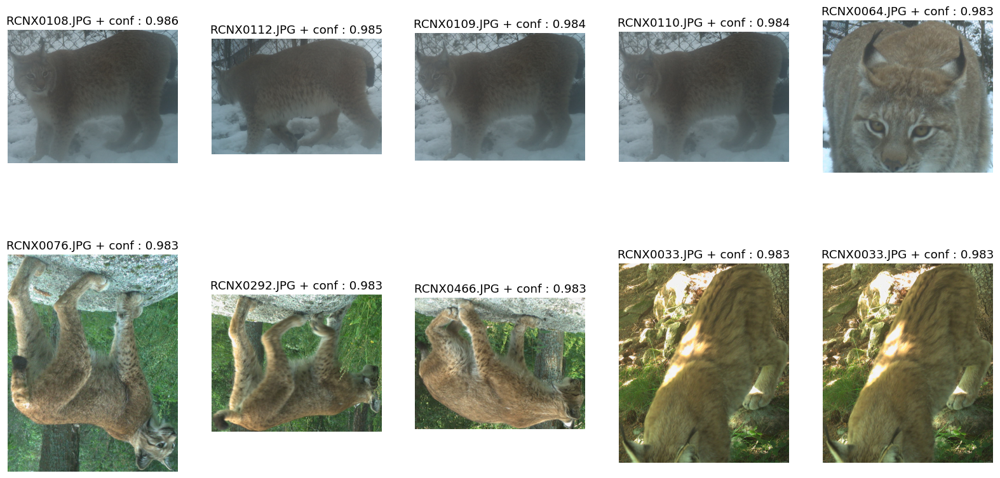

In [73]:
plot_images_conf(df_bbox_norway_single_detection, by="largest")

In [74]:
df_norway_with_bbox = pd.merge(df_norway, df_bbox_norway_single_detection[['file', 'conf', 'x', 'y', 'width', 'height']], how='inner', left_on='filepath', right_on='file')
df_norway_with_bbox = df_norway_with_bbox.drop('file', axis=1)

df_norway_with_bbox

,filepath,lynx_id,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1,0.963,0.0000,458.9280,934.9120,686.880
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1,0.960,0.0000,99.9936,788.8896,932.976
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1,0.892,303.9232,770.9184,267.8784,218.880
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1,0.793,0.0000,607.9488,404.8896,334.848
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1,0.872,0.0000,869.9040,301.8752,187.920
...,...,...,...,...,...,...,...
9677,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nordens 2,0.961,1451.8272,363.8880,314.9824,273.888
9678,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nordens 2,0.936,1282.8672,372.9600,366.7968,300.960
9679,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nordens 2,0.922,784.9984,522.0000,491.9296,196.992
9680,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nordens 2,0.954,1239.8592,369.9360,413.9008,312.912


#### Bounding box confidence distribution

<Axes: xlabel='conf', ylabel='Count'>

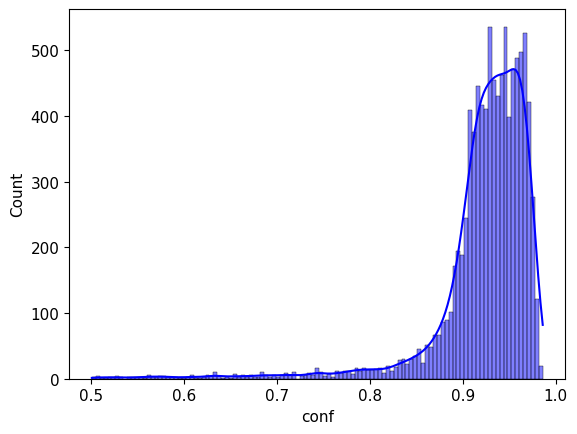

In [76]:
import seaborn as sns

sns.histplot(df_norway_with_bbox["conf"], kde=True, color='blue')

#### Compute `image_number` for each individual

This number is no longer the same as initially following filtering, particularly of images with no bounding box detected, for example.

In [77]:
df_norway_with_bbox['image_number'] = df_norway_with_bbox.groupby('lynx_id').cumcount() + 1
df_norway_with_bbox

,filepath,lynx_id,conf,x,y,width,height,image_number
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1,0.963,0.0000,458.9280,934.9120,686.880,1
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1,0.960,0.0000,99.9936,788.8896,932.976,2
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1,0.892,303.9232,770.9184,267.8784,218.880,3
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1,0.793,0.0000,607.9488,404.8896,334.848,4
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Lang 1,0.872,0.0000,869.9040,301.8752,187.920,5
...,...,...,...,...,...,...,...,...
9677,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nordens 2,0.961,1451.8272,363.8880,314.9824,273.888,279
9678,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nordens 2,0.936,1282.8672,372.9600,366.7968,300.960,280
9679,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nordens 2,0.922,784.9984,522.0000,491.9296,196.992,281
9680,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nordens 2,0.954,1239.8592,369.9360,413.9008,312.912,282


In [78]:
df_norway_with_bbox.to_csv(DATASET / "norway" / "lynx_dataset_norway.csv", index=False)

## **German dataset**

In [4]:
GERMANY_DATASET_PATH = DATASET / "germany/BFNP_Heurich"

### Simple preprocessing

In [5]:
dataset_dict = {
    "filepath": [],
    "lynx_id": [],
}

In [6]:
def parse_filename(filename):
    parts = filename.split("BFNP_Heurich/")[1:][0].split("/")[1:]
    
    lynx_id = parts[0]
    
    return {"lynx_id": lynx_id}

In [7]:
img_nok = 0

for current_directory, _, files in os.walk(GERMANY_DATASET_PATH):
    for file in files:
        absolute_path = os.path.abspath(os.path.join(current_directory, file))
        if re.compile(r'\.(jpg|jpeg|png)$', re.IGNORECASE).search(absolute_path) and 'B0' not in absolute_path:
            
            try:
                parsed = parse_filename(absolute_path)

                dataset_dict['filepath'].append(absolute_path)
                dataset_dict['lynx_id'].append(parsed['lynx_id'])
            except:
                img_nok += 1

print(f"{img_nok=}")

img_nok=0


### Tricky preprocessing

In [5]:
# dataset_dict = {
#     "filepath": [],
#     "lynx_id": [],
#     "date": [],
#     "location": [],
#     "side": [],
# }

In [30]:
# from datetime import datetime

# def parse_filename_sup_2020(filename):
#     parts = filename.split("BFNP_Heurich/")[1:][0].split("/")[1:]
#     parts = [element for element in parts if element != "extensiv"]
    
#     lynx_id = parts[0]
    
#     date_side_location = parts[1].split(".")[0].split("_")
#     date = datetime.strptime(date_side_location[0], "%Y%m%d")

#     if date_side_location[1] not in ['L', 'R']:
#         raise ValueError("Problem with image naming.")
    
#     return {"lynx_id": lynx_id, "date": date, "side": date_side_location[1], "location": date_side_location[2]}


# def parse_filename_2017_2020(filename):
#     parts = filename.split("BFNP_Heurich/")[1:][0].split("/")[1:]
#     parts = [element for element in parts if element != "extensiv"]
    
#     lynx_id = parts[0]
#     location = parts[1]
    
#     date_side = parts[2].split(".")[0].split("_")
#     date = datetime.strptime(date_side[0], "%Y%m%d")
#     side = date_side[1]
#     match = re.match(r'([LR])(\d*)', side)
#     if match:
#         side = match.group(1)
#     else:
#         raise ValueError("Problem with image naming.")
    
#     return {"lynx_id": lynx_id, "date": date, "side": side, "location": location}

In [ ]:
# parse_filename_inf_2020("/gpfsscratch/rech/ads/commun/datasets/extracted/germany/BFNP_Heurich/2018_2019/L232_Hakerl_Juv.18-L2/Eselurgespreng/20181123_L3.JPG")

{'lynx_id': 'L232_Hakerl_Juv.18-L2',
 'date': datetime.datetime(2018, 11, 23, 0, 0),
 'side': 'L',
 'location': 'Eselurgespreng'}

In [32]:
# parse_filename_sup_2020("/gpfsscratch/rech/ads/commun/datasets/extracted/germany/BFNP_Heurich/2021_2022/B302_Malu/20220208_L_Talsperre.JPG")

{'lynx_id': 'B302_Malu',
 'date': datetime.datetime(2022, 2, 8, 0, 0),
 'side': 'L',
 'location': 'Talsperre'}

In [ ]:
# nb_image = 0
# nb_image_sup_2020 = 0
# nb_image_2017_2020 = 0
# nb_image_inf_2017 = 0
# nok_sup_2020 = 0
# nok_2017_2020 = 0
# nok_inf_2017 = 0

# for current_directory, _, files in os.walk(GERMANY_DATASET_PATH):
#     for file in files:
#         absolute_path = os.path.abspath(os.path.join(current_directory, file))
#         if re.compile(r'\.(jpg|jpeg|png)$', re.IGNORECASE).search(absolute_path) and 'B0' not in absolute_path:
#             nb_image += 1
            
#             if any(year_range in absolute_path for year_range in ['2020_2021', '2021_2022']):  # image.date > 2020
#                 nb_image_sup_2020 += 1
#                 try:
#                     parsed = parse_filename_sup_2020(absolute_path)
                    
#                     dataset_dict['filepath'].append(absolute_path)
#                     dataset_dict['lynx_id'].append(parsed['lynx_id'])
#                     dataset_dict['date'].append(parsed['date'])
#                     dataset_dict['location'].append(parsed['location'])
#                     dataset_dict['side'].append(parsed['side'])
#                 except:
#                     nok_sup_2020+=1
#             elif any(year_range in absolute_path for year_range in ['2017_2018', '2018_2019', '2019_2020']):  # 2017 < image.date < 2020                                                            # 2017 <image.date < 2020
#                 nb_image_2017_2020 += 1
#                 try:
#                     parsed = parse_filename_2017_2020(absolute_path)
                    
#                     dataset_dict['filepath'].append(absolute_path)
#                     dataset_dict['lynx_id'].append(parsed['lynx_id'])
#                     dataset_dict['date'].append(parsed['date'])
#                     dataset_dict['location'].append(parsed['location'])
#                     dataset_dict['side'].append(parsed['side'])
#                 except:
#                     nok_2017_2020+=1
                    
#             else: # image.date < 2017
#                 nb_image_inf_2017 += 1
#                 print(absolute_path)

# print(f"{nb_image=}")
# print(f"{nb_image_sup_2020=}")
# print(f"{nok_sup_2020=}")
# print(f"{nb_image_2017_2020=}")
# print(f"{nok_2017_2020=}")
# print(f"{nb_image_inf_2017=}")
# print(f"{nok_inf_2017=}")

### Build dataframe

In [8]:
df_germany = pd.DataFrame(dataset_dict)
df_germany

,filepath,lynx_id
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope
...,...,...
5958,/gpfsscratch/rech/ads/commun/datasets/extracte...,Luha
5959,/gpfsscratch/rech/ads/commun/datasets/extracte...,B31_Geli_Luna_Juv.13_1
5960,/gpfsscratch/rech/ads/commun/datasets/extracte...,B31_Geli_Luna_Juv.13_1
5961,/gpfsscratch/rech/ads/commun/datasets/extracte...,B266_Juvenil Neu_2013


In [9]:
df_germany['lynx_id'].value_counts()

lynx_id
B38_Stefan                   494
B238_Rico                    481
B500_Patrik                  460
B224_Nora                    347
B23_Hakerl                   274
                            ... 
Geli_Juv.15-2                  1
B48                            1
B45_Gregor_Luna_Juv.15-1       1
R216                           1
L201_Neu_2_ev.Nora_Juv.09      1
Name: count, Length: 245, dtype: int64

#### Bounding box detection

In [17]:
germany_output_megadetector = DATASET / "germany/bbox_germany.json"  # WARNING: change filename if needed

image_filenames = path_utils.find_images(GERMANY_DATASET_PATH, recursive=True)
image_filenames=[file for file in image_filenames]

print(f"Number of images in dataset on disk: {len(image_filenames)}")
print(f"Number of unique paths in the dataframe {df_germany['filepath'].nunique()}")

Number of images in dataset on disk: 6161
Number of unique paths in the dataframe 5963


In [13]:
results = load_and_run_detector_batch(
    model_file='/gpfswork/rech/ads/commun/megadetector/md_v5a.0.0.pt', 
    image_file_names=image_filenames, 
    quiet=True, 
    include_image_size=True, 
    confidence_threshold=0.5
)

output = write_results_to_file(results, germany_output_megadetector)

PyTorch reports 1 available CUDA devices
GPU available: True


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Imported YOLOv5 as utils.*
Using PyTorch version 2.1.1


Fusing layers... 
Fusing layers... 
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs


Sending model to GPU
Loaded model in 46.44 seconds
Loaded model in 46.44 seconds


100%|██████████| 6161/6161 [11:47<00:00,  8.71it/s]  


Output file saved at /gpfsscratch/rech/ads/commun/datasets/extracted/bbox_germany.json


In [18]:
with open(germany_output_megadetector, 'r') as f:
    bbox_germany = json.load(f)

Some images may not have bounding boxes found.

In [30]:
no_bbox_germany, multiple_bbox_germany = get_no_and_multiple_bbox(bbox_germany)

342 images have no bounding boxes detected.
523 images have several bounding boxes detected.
Total: 6161 images.


Sometimes the length is not identical between `bbox_germany` and `df_germany`. To do this, we look for differences.

In [25]:
all_file_megadetector = []
for img in bbox_germany['images']:
    all_file_megadetector.append(img['file']) 
print(len(all_file_megadetector))

all_file_df_germany = df_germany['filepath'].to_list()
print(len(all_file_df_germany))

6161
5963


In [ ]:
set(all_file_megadetector) - set(all_file_df_germany)

In [27]:
set(all_file_df_germany) - set(all_file_megadetector)

set()

Back to bbox...
Absolute coordinates of the bounding box (x, y, width and height) based on the image dimensions

In [28]:
df_bbox_germany = flatten_bbox(bbox_germany, add_image_without_bbox=False, verbose=False)
df_bbox_germany = absolute_coordinates_bbox(df_bbox_germany)
df_bbox_germany

,file,im_width,im_height,category,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.978,842.95680,670.9248,541.9008,334.8480
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.976,326.86080,688.8960,582.8608,304.8960
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.980,711.88480,602.8800,382.9760,409.9584
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.923,0.00000,527.9232,1360.8960,955.8528
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.957,0.00000,665.8560,2044.9280,817.9200
...,...,...,...,...,...,...,...,...,...
6411,/gpfsscratch/rech/ads/commun/datasets/extracte...,2592,2000,1,0.966,118.99872,1009.8000,474.8544,381.8000
6412,/gpfsscratch/rech/ads/commun/datasets/extracte...,2576,1984,1,0.942,295.98240,793.9968,573.9328,357.9136
6413,/gpfsscratch/rech/ads/commun/datasets/extracte...,2576,1984,1,0.945,2283.88160,825.9392,266.8736,231.9296
6414,/gpfsscratch/rech/ads/commun/datasets/extracte...,1920,1080,1,0.972,754.94400,186.9480,1047.9360,610.9560


#### 10 images cropped with the least confidence are displayed

Only images with a single bounding box are displayed.

In [33]:
df_bbox_germany_single_detection, df_bbox_germany_multiple_detections = separate_single_multiple_df(df_bbox_germany)

print(f"{len(df_bbox_germany_single_detection)=}")
print(f"{len(df_bbox_germany_multiple_detections)=}")

len(df_bbox_germany_single_detection)=5296
len(df_bbox_germany_multiple_detections)=1120


In [34]:
%matplotlib inline

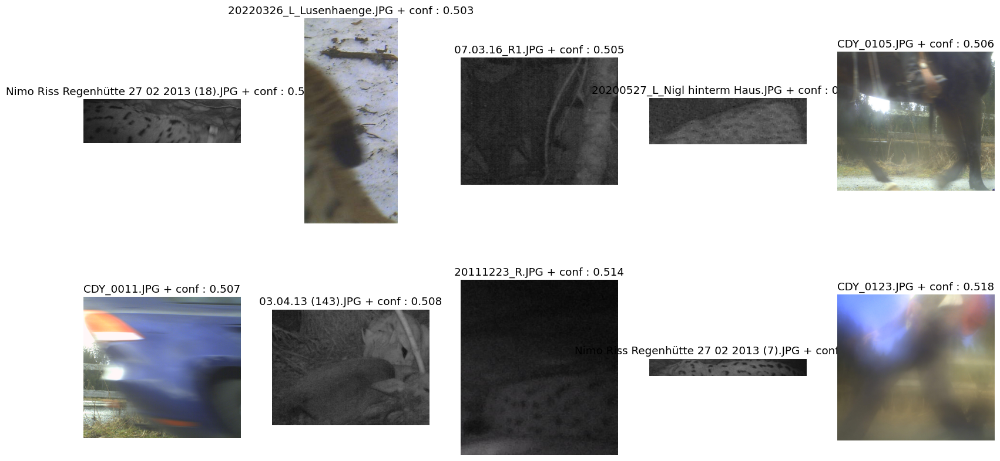

In [35]:
plot_images_conf(df_bbox_germany_single_detection, by="smallest")

#### 10 images cropped with the largest confidence are displayed

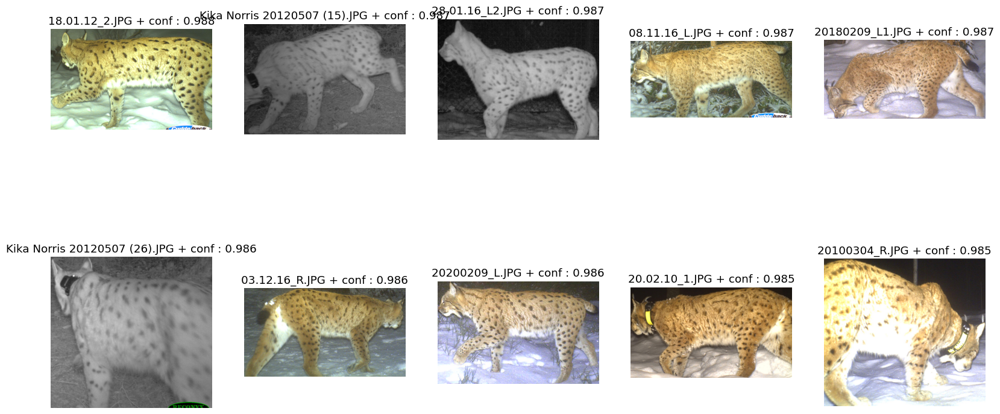

In [36]:
plot_images_conf(df_bbox_germany_single_detection, by="largest")

In [37]:
df_germany_with_bbox = pd.merge(df_germany, df_bbox_germany_single_detection[['file', 'conf', 'x', 'y', 'width', 'height']], how='inner', left_on='filepath', right_on='file')
df_germany_with_bbox = df_germany_with_bbox.drop('file', axis=1)

df_germany_with_bbox

,filepath,lynx_id,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope,0.909,1472.8320,490.9680,379.9680,273.9960
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope,0.929,1638.9120,486.9720,280.8960,287.9280
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope,0.930,1554.8160,486.0000,364.9920,288.9000
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope,0.945,389.9392,1140.9408,377.8560,332.8512
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope,0.897,1536.0000,562.9440,510.9760,356.9664
...,...,...,...,...,...,...,...
5126,/gpfsscratch/rech/ads/commun/datasets/extracte...,Luha,0.976,0.0000,660.9408,1440.9728,822.9888
5127,/gpfsscratch/rech/ads/commun/datasets/extracte...,Luha,0.945,706.9696,584.9088,701.8496,396.9024
5128,/gpfsscratch/rech/ads/commun/datasets/extracte...,B31_Geli_Luna_Juv.13_1,0.977,544.9728,461.8752,833.9456,495.9744
5129,/gpfsscratch/rech/ads/commun/datasets/extracte...,B266_Juvenil Neu_2013,0.975,552.9600,613.9392,1000.8576,755.8656


#### Bounding box confidence distribution

<Axes: xlabel='conf', ylabel='Count'>

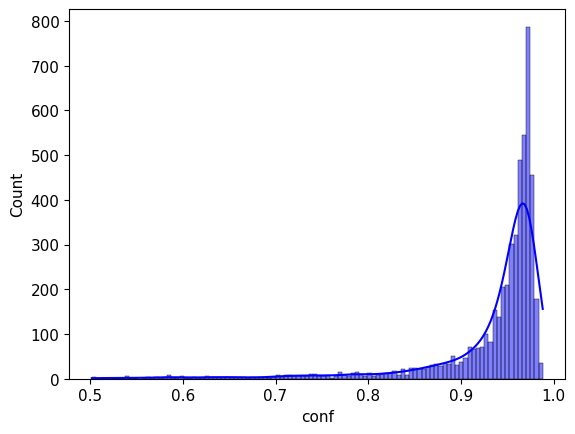

In [38]:
import seaborn as sns

sns.histplot(df_germany_with_bbox["conf"], kde=True, color='blue')

#### Compute `image_number` for each individual

This number is no longer the same as initially following filtering, particularly of images with no bounding box detected, for example.

In [39]:
df_germany_with_bbox['image_number'] = df_germany_with_bbox.groupby('lynx_id').cumcount() + 1
df_germany_with_bbox

,filepath,lynx_id,conf,x,y,width,height,image_number
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope,0.909,1472.8320,490.9680,379.9680,273.9960,1
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope,0.929,1638.9120,486.9720,280.8960,287.9280,2
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope,0.930,1554.8160,486.0000,364.9920,288.9000,3
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope,0.945,389.9392,1140.9408,377.8560,332.8512,4
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,B30_Hope,0.897,1536.0000,562.9440,510.9760,356.9664,5
...,...,...,...,...,...,...,...,...
5126,/gpfsscratch/rech/ads/commun/datasets/extracte...,Luha,0.976,0.0000,660.9408,1440.9728,822.9888,7
5127,/gpfsscratch/rech/ads/commun/datasets/extracte...,Luha,0.945,706.9696,584.9088,701.8496,396.9024,8
5128,/gpfsscratch/rech/ads/commun/datasets/extracte...,B31_Geli_Luna_Juv.13_1,0.977,544.9728,461.8752,833.9456,495.9744,1
5129,/gpfsscratch/rech/ads/commun/datasets/extracte...,B266_Juvenil Neu_2013,0.975,552.9600,613.9392,1000.8576,755.8656,1


In [40]:
df_germany_with_bbox.to_csv(DATASET / "germany" / "lynx_dataset_germany.csv", index=False)

## **Slovenian dataset**

In [4]:
SLOVENIA_DATASET_PATH = DATASET / "slovenia/Slovenia_Krofel"

In [5]:
dataset_dict = {
    "filepath": [],
    "lynx_id": [],
    "date": [],
    "location": [],
    "longitude": [],
    "latitude": [],
    "country": [],
    "sex": [],
}

In [6]:
cnt_individuals = 0

for current_directory, _, files in os.walk(SLOVENIA_DATASET_PATH):
    for file in files:
        absolute_path = os.path.abspath(os.path.join(current_directory, file))
        if absolute_path.endswith(".csv") and 'Doru' not in absolute_path:  # 1 csv = 1 individual
            cnt_individuals += 1
            # Extract data from the CSV
            individual_csv = pd.read_csv(absolute_path, encoding='ISO-8859-1')
            
            # Get filepath
            filepaths = individual_csv['Encounter.mediaAsset0']
            filepaths = filepaths.apply(lambda filepath: current_directory + "/" + Path(file).stem + "/" + filepath.replace(" ", ""))
            # Get date
            dates = pd.to_datetime(individual_csv['Encounter.year'].astype(str) + '-' + individual_csv['Encounter.month'].astype(str) + '-' + individual_csv['Encounter.day'].astype(str) + ' ' + individual_csv['Encounter.hour'].astype(str) + ':' + individual_csv['Encounter.minutes'].astype(str))

            dataset_dict["filepath"].extend(filepaths.tolist())
            dataset_dict["lynx_id"].extend(individual_csv['MarkedIndividual.nickname'].tolist())
            dataset_dict["date"].extend(dates.tolist())
            dataset_dict["location"].extend(individual_csv['Encounter.verbatimLocality'].tolist())  # locationID is always the same: Dinarides
            dataset_dict["longitude"].extend(individual_csv['Encounter.decimalLongitude'].tolist())
            dataset_dict["latitude"].extend(individual_csv['Encounter.decimalLatitude'].tolist())
            dataset_dict["country"].extend(individual_csv['Encounter.country'].tolist())
            dataset_dict["sex"].extend(individual_csv['Encounter.sex'].tolist())

print(f"{cnt_individuals=}")
# individual_csv

cnt_individuals=52


In [7]:
df_slovenia = pd.DataFrame(dataset_dict)
df_slovenia

,filepath,lynx_id,date,location,longitude,latitude,country,sex
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2021-08-29 18:37:00,LD_Col,14.1033,45.8814,Slovenia,Male
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2021-10-30 10:05:00,LD_Bukovje,14.0924,45.8225,Slovenia,Male
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2022-01-23 15:06:00,LD_Col,14.1033,45.8814,Slovenia,Male
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2022-03-02 15:54:00,LD_Col,14.1033,45.8814,Slovenia,Male
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2022-03-02 15:54:00,LD_Col,14.1033,45.8814,Slovenia,Male
...,...,...,...,...,...,...,...,...
2025,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2022-11-26 12:49:00,LD_Ribnica,14.7730,45.7510,Slovenia,Male
2026,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2023-04-17 14:59:00,LD_Ribnica,14.7730,45.7510,Slovenia,Male
2027,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2022-11-27 11:03:00,LD_Ribnica,14.7730,45.7510,Slovenia,Male
2028,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2023-02-06 00:21:00,LD_Ribnica,14.7349,45.7776,Slovenia,Male


In [8]:
df_slovenia["sex"].value_counts()

sex
Male      1391
Female     580
Name: count, dtype: int64

In [9]:
all_files_exist = all(df_slovenia['filepath'].apply(os.path.exists))
all_files_exist

True

#### Bounding box detection

In [10]:
slovenia_output_megadetector = DATASET / "bbox_slovenia.json"  # WARNING: change filename if needed

In [11]:
image_filenames = path_utils.find_images(SLOVENIA_DATASET_PATH, recursive=True)
image_filenames=[file for file in image_filenames if "Doru" not in file]
len(image_filenames)

2027

In [12]:
df_slovenia['filepath'].nunique()

2027

In [13]:
results = load_and_run_detector_batch(
    model_file='/gpfswork/rech/ads/commun/megadetector/md_v5a.0.0.pt', 
    image_file_names=image_filenames, 
    quiet=True, 
    include_image_size=True, 
    confidence_threshold=0.5
)

output = write_results_to_file(results, slovenia_output_megadetector)

PyTorch reports 1 available CUDA devices
GPU available: True


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Imported YOLOv5 as utils.*
Using PyTorch version 2.1.1


Fusing layers... 
Fusing layers... 
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs


Sending model to GPU
Loaded model in 20.64 seconds
Loaded model in 20.64 seconds


100%|██████████| 2027/2027 [05:55<00:00,  5.71it/s]


Output file saved at /gpfsscratch/rech/ads/commun/datasets/extracted/bbox_slovenia.json


In [14]:
with open(slovenia_output_megadetector, 'r') as f:
    bbox_slovenia = json.load(f)

Some images may not have bounding boxes found.

In [15]:
no_bbox_slovenia, multiple_bbox_slovenia = get_no_and_multiple_bbox(bbox_slovenia)

55 images have no bounding boxes detected.
20 images have several bounding boxes detected.
Total: 2027 images.


Sometimes the length is not identical between `bbox_slovenia` and `df_slovenia`. To do this, we look for differences.

In [16]:
all_file_megadetector = []
for img in bbox_slovenia['images']:
    all_file_megadetector.append(img['file']) 
print(len(all_file_megadetector))

all_file_df_slovenia = df_slovenia['filepath'].to_list()
print(len(all_file_df_slovenia))

2027
2030


In [17]:
set(all_file_megadetector) - set(all_file_df_slovenia)

set()

In [18]:
set(all_file_df_slovenia) - set(all_file_megadetector)

set()

Back to bbox...

In [19]:
df_bbox_slovenia = flatten_bbox(bbox_slovenia, add_image_without_bbox=False, verbose=False)
df_bbox_slovenia

,file,im_width,im_height,category,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.937,0.8874,0.4589,0.1125,0.2643
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.940,0.2001,0.4516,0.2018,0.2084
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1440,1,0.955,0.0000,0.5472,0.1538,0.1569
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,5376,3024,1,0.954,0.1199,0.4543,0.1793,0.1812
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,5376,3024,1,0.883,0.6649,0.5162,0.1149,0.1679
...,...,...,...,...,...,...,...,...,...
1987,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.906,0.5576,0.4185,0.2907,0.3195
1988,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.941,0.6446,0.4684,0.3084,0.5000
1989,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.908,0.1502,0.1869,0.2598,0.7784
1990,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.966,0.2191,0.3858,0.4561,0.5801


Absolute coordinates of the bounding box (x, y, width and height) based on the image dimensions

In [20]:
df_bbox_slovenia = absolute_coordinates_bbox(df_bbox_slovenia)

df_bbox_slovenia

,file,im_width,im_height,category,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.937,4571.8848,1820.9152,579.6000,1048.7424
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.940,1030.9152,1791.9488,1039.6736,826.9312
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1440,1,0.955,0.0000,787.9680,314.9824,225.9360
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,5376,3024,1,0.954,644.5824,1373.8032,963.9168,547.9488
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,5376,3024,1,0.883,3574.5024,1560.9888,617.7024,507.7296
...,...,...,...,...,...,...,...,...,...
1987,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.906,2872.7552,1660.6080,1497.6864,1267.7760
1988,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.941,3320.9792,1858.6112,1588.8768,1984.0000
1989,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.908,773.8304,741.6192,1338.4896,3088.6912
1990,/gpfsscratch/rech/ads/commun/datasets/extracte...,5152,3968,1,0.966,1128.8032,1530.8544,2349.8272,2301.8368


#### 10 images cropped with the least confidence are displayed

Only images with a single bounding box are displayed.

In [21]:
df_bbox_slovenia_single_detection, df_bbox_slovenia_multiple_detections = separate_single_multiple_df(df_bbox_slovenia)

print(len(df_bbox_slovenia_single_detection))
print(len(df_bbox_slovenia_multiple_detections))

1952
40


In [22]:
%matplotlib inline

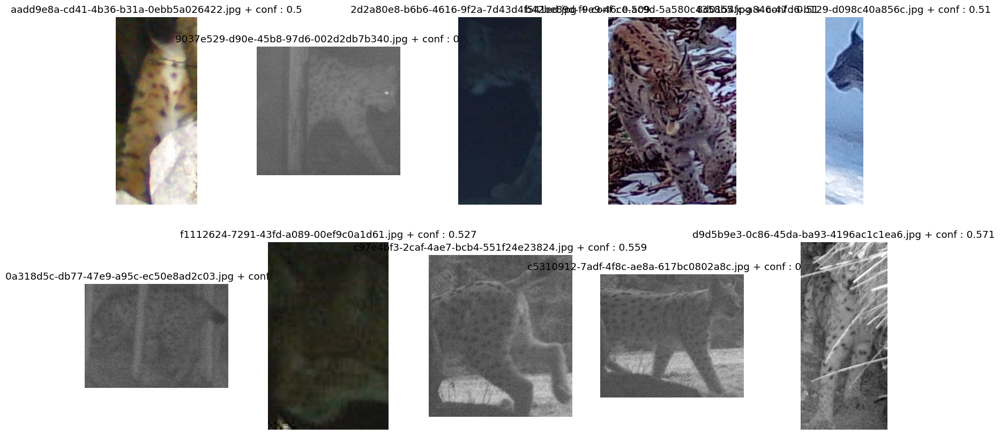

In [23]:
plot_images_conf(df_bbox_slovenia_single_detection, by="smallest")

#### 10 images cropped with the largest confidence are displayed

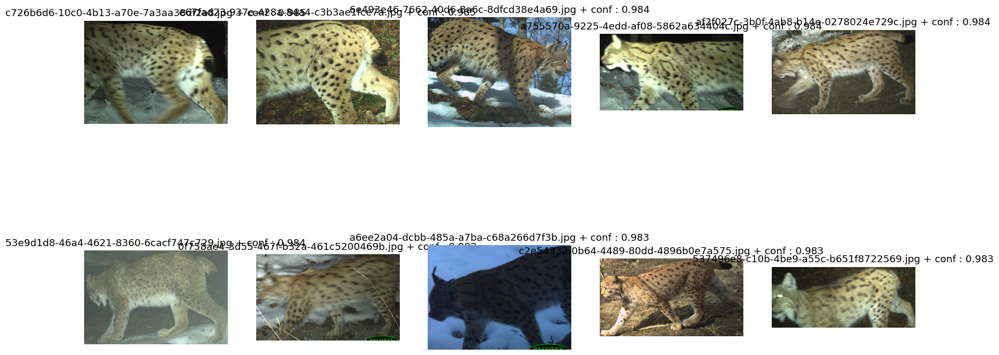

In [24]:
plot_images_conf(df_bbox_slovenia_single_detection, by="largest")

In [25]:
df_slovenia_with_bbox = pd.merge(df_slovenia, df_bbox_slovenia_single_detection[['file', 'conf', 'x', 'y', 'width', 'height']], how='inner', left_on='filepath', right_on='file')
df_slovenia_with_bbox = df_slovenia_with_bbox.drop('file', axis=1)

df_slovenia_with_bbox

,filepath,lynx_id,date,location,longitude,...,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2021-08-29 18:37:00,LD_Col,14.1033,...,0.940,895.932800,1143.9744,1109.7408,642.8160
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2021-10-30 10:05:00,LD_Bukovje,14.0924,...,0.971,2132.928000,1884.8000,1353.9456,1169.7664
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2022-01-23 15:06:00,LD_Col,14.1033,...,0.965,0.999488,1719.7312,1174.6560,1016.9984
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2022-03-02 15:54:00,LD_Col,14.1033,...,0.954,1584.755200,1417.7664,996.9120,524.9664
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2022-03-02 15:54:00,LD_Col,14.1033,...,0.971,285.987520,2120.8960,1040.7040,604.7232
...,...,...,...,...,...,...,...,...,...,...,...
1950,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2022-10-09 22:18:00,LD_Ribnica,14.7349,...,0.953,4685.811200,1762.9416,1534.7584,748.9944
1951,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2022-11-26 12:49:00,LD_Ribnica,14.7730,...,0.961,1126.451200,1057.6944,1010.4192,809.6760
1952,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2023-04-17 14:59:00,LD_Ribnica,14.7730,...,0.959,4531.520000,1178.7048,1229.9392,629.7480
1953,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2023-02-06 00:21:00,LD_Ribnica,14.7349,...,0.917,4902.822400,1309.9464,1006.6560,674.9064


#### Bounding box confidence distribution

<Axes: xlabel='conf', ylabel='Count'>

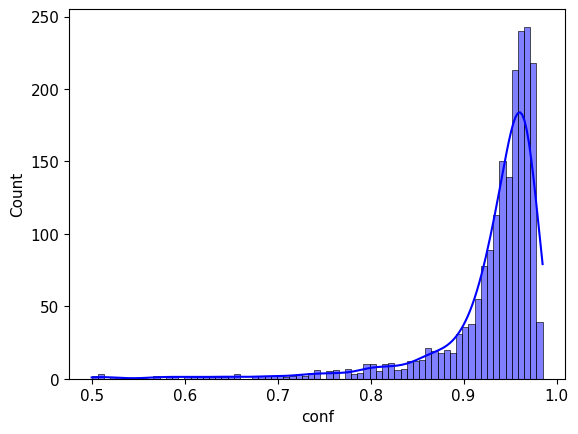

In [26]:
import seaborn as sns

sns.histplot(df_slovenia_with_bbox["conf"], kde=True, color='blue')

#### Compute `image_number` for each individual

This number is no longer the same as initially following filtering, particularly of images with no bounding box detected, for example.

In [27]:
df_slovenia_with_bbox['image_number'] = df_slovenia_with_bbox.groupby('lynx_id').cumcount() + 1
df_slovenia_with_bbox

,filepath,lynx_id,date,location,longitude,...,x,y,width,height,image_number
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2021-08-29 18:37:00,LD_Col,14.1033,...,895.932800,1143.9744,1109.7408,642.8160,1
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2021-10-30 10:05:00,LD_Bukovje,14.0924,...,2132.928000,1884.8000,1353.9456,1169.7664,2
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2022-01-23 15:06:00,LD_Col,14.1033,...,0.999488,1719.7312,1174.6560,1016.9984,3
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2022-03-02 15:54:00,LD_Col,14.1033,...,1584.755200,1417.7664,996.9120,524.9664,4
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nanos1,2022-03-02 15:54:00,LD_Col,14.1033,...,285.987520,2120.8960,1040.7040,604.7232,5
...,...,...,...,...,...,...,...,...,...,...,...
1950,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2022-10-09 22:18:00,LD_Ribnica,14.7349,...,4685.811200,1762.9416,1534.7584,748.9944,459
1951,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2022-11-26 12:49:00,LD_Ribnica,14.7730,...,1126.451200,1057.6944,1010.4192,809.6760,460
1952,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2023-04-17 14:59:00,LD_Ribnica,14.7730,...,4531.520000,1178.7048,1229.9392,629.7480,461
1953,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goru,2023-02-06 00:21:00,LD_Ribnica,14.7349,...,4902.822400,1309.9464,1006.6560,674.9064,462


In [28]:
df_slovenia_with_bbox.to_csv(DATASET / "slovenia" / "lynx_dataset_slovenia.csv", index=False)

## **French dataset**

In [32]:
FRANCE_DATASET_PATH = DATASET / "france" / "Deep learning lynx - data" / "0_dataset_raw"

### CSV generation

In [33]:
individual_folders = os.listdir(FRANCE_DATASET_PATH)

In [34]:
dataset_dict = {
    "filepath": [],
    "lynx_id": [],
    "source": [],
    "pattern": [],
    "date": [],
    "location": [],
    "image_number": []
}

In [35]:
def parse_filename(filename):
    filename = filename.split(".")[0]
    parts = filename.split("_")
    
    return {"id_lynx": parts[0], "source": parts[1], "pattern": parts[2], "date": parts[3], "location": parts[4], "image_number": parts[5]}

In [36]:
for current_directory, _, files in os.walk(FRANCE_DATASET_PATH):
    if "0_dataset_Marie_3_individus" in current_directory :
        continue

    for file in files:
        absolute_path = os.path.abspath(os.path.join(current_directory, file))
        if file.endswith((".txt", ".xlsx", ".db")):
            continue
        if file.startswith(('broken')):
            print(file)
            continue
        if '.ipynb_checkpoints' in absolute_path:
            print(file)
            continue
            
        try:
            parsed_filename = parse_filename(file)
        except:
            print(absolute_path)  # TODO: problem with these filenames
            continue  # skip them
            
        dataset_dict["filepath"].append(absolute_path)
        dataset_dict["lynx_id"].append(parsed_filename["id_lynx"])
        dataset_dict["source"].append(parsed_filename["source"])
        dataset_dict["pattern"].append(parsed_filename["pattern"])
        dataset_dict["date"].append(parsed_filename["date"])
        dataset_dict["location"].append(parsed_filename["location"])
        dataset_dict["image_number"].append(parsed_filename["image_number"])

broken_FDC01_point_36.2_evosges_le_col_2018_09_01_flanc_droit.JPG
broken_FDC01_point_15.2_corlier_montlier_2019_02_10_flanc_droit_erreur date-F01_047.JPG
broken_1556_FD_2021-05-26-21_100_1-FDC39-Mont-sur-Monnet.jpg
broken_300_2021-05-02-100_1-FDC39-Mont-sur-Monnet.jpg
broken_1556_FD_2021-07-04-21_100_1-FDC39-Mont-sur-Monnet (2).jpg
broken_1556_FG__2021-07-04-21_100_1-FDC39-Mont-sur-Monnet (1).jpg
broken_Villard_F39-038_OFB_OCELLES_2015-03-22_Villard-Saint-Sauveur_4322_03_15.JPG


In [37]:
df_france = pd.DataFrame(dataset_dict)
df_france

,filepath,lynx_id,source,pattern,date,location,image_number
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-04-27,NA,5
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-05-05,NA,1
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-17,NA,3
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-16,NA,6
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-05,NA,7
...,...,...,...,...,...,...,...
3324,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,Goumois,4
3325,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,Goumois,3
3326,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,Goumois,1
3327,/gpfsscratch/rech/ads/commun/datasets/extracte...,1017,OFB,SPOTS,2017-08-08,Chaux-Neuve,2


**Convert the values in the "date" column into datetime**. The format most often found is YYYY-MM-DD but sometimes day and month are reversed. Some other strange dates are also printed (replaced by NaT).
  
**Note**: NA values are replaced by nan values recognised by pd.isna when the csv is saved.

In [38]:
from datetime import datetime

def convert_date(date_str):
    if pd.isna(date_str):
        return None
    try:
        return datetime.strptime(date_str, "%Y-%m-%d")
    except ValueError:
        try:
            return datetime.strptime(date_str, "%Y-%d-%m")
        except ValueError:
            print(date_str)
            return None
        
df_france["date"] = df_france["date"].apply(convert_date)
df_france

NA
NA
NA
NA
NA
NA
NA
NA
NA
NA
NA
NA
NA
NA
NA
NA
NA
NA
2021
2021
2021-13-13
2021-13-13
NA
NA
NA
NA
NA
NA
NA
NA
NA
NA


,filepath,lynx_id,source,pattern,date,location,image_number
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-04-27,NA,5
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-05-05,NA,1
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-17,NA,3
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-16,NA,6
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-05,NA,7
...,...,...,...,...,...,...,...
3324,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,Goumois,4
3325,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,Goumois,3
3326,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,Goumois,1
3327,/gpfsscratch/rech/ads/commun/datasets/extracte...,1017,OFB,SPOTS,2017-08-08,Chaux-Neuve,2


#### Deleting broken images

In [39]:
all_files_exist = all(df_france['filepath'].apply(os.path.exists))
all_files_exist

True

#### Bounding box detection

In [40]:
france_output_megadetector = DATASET / "france" / "bbox_france.json"  # WARNING: change filename if needed

In [41]:
image_filenames = path_utils.find_images(FRANCE_DATASET_PATH, recursive=True)
image_filenames=[file for file in image_filenames if "3_individus" not in file]
len(image_filenames)

3336

In [42]:
results = load_and_run_detector_batch(
    model_file='/gpfswork/rech/ads/commun/megadetector/md_v5a.0.0.pt', 
    image_file_names=image_filenames, 
    quiet=True, 
    include_image_size=True, 
    confidence_threshold=0.5
)

output = write_results_to_file(results, france_output_megadetector)

PyTorch reports 1 available CUDA devices
GPU available: True


Fusing layers... 
Fusing layers... 
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs


Sending model to GPU
Loaded model in 1.72 seconds
Loaded model in 1.72 seconds


100%|██████████| 3336/3336 [06:22<00:00,  8.72it/s]


Output file saved at /gpfsscratch/rech/ads/commun/datasets/extracted/france/bbox_france.json


In [48]:
with open(france_output_megadetector, 'r') as f:
    bbox_france = json.load(f)

Some images may not have bounding boxes found.

In [49]:
no_bbox_france, multiple_bbox_france = get_no_and_multiple_bbox(bbox_france)

33 images have no bounding boxes detected.
215 images have several bounding boxes detected.
Total: 3336 images.


Sometimes the length is not identical between `bbox_france` and `df_france`. To do this, we look for differences.

In [50]:
all_file_megadetector = []
for img in bbox_france['images']:
    all_file_megadetector.append(img['file']) 
print(len(all_file_megadetector))

all_file_df_france = df_france['filepath'].to_list()
print(len(all_file_df_france))

3336
3329


In [51]:
set(all_file_megadetector) - set(all_file_df_france)

{'/gpfsscratch/rech/ads/commun/datasets/extracted/france/Deep learning lynx - data/0_dataset_raw/0_dataset_Marie_OFB_ocelles/OFB_OCELLES_F01-047=922/broken_FDC01_point_15.2_corlier_montlier_2019_02_10_flanc_droit_erreur date-F01_047.JPG',
 '/gpfsscratch/rech/ads/commun/datasets/extracted/france/Deep learning lynx - data/0_dataset_raw/0_dataset_Marie_OFB_ocelles/OFB_OCELLES_F01-047=922/broken_FDC01_point_36.2_evosges_le_col_2018_09_01_flanc_droit.JPG',
 '/gpfsscratch/rech/ads/commun/datasets/extracted/france/Deep learning lynx - data/0_dataset_raw/0_dataset_Marie_OFB_ocelles/OFB_OCELLES_F39-038/broken_Villard_F39-038_OFB_OCELLES_2015-03-22_Villard-Saint-Sauveur_4322_03_15.JPG',
 '/gpfsscratch/rech/ads/commun/datasets/extracted/france/Deep learning lynx - data/0_dataset_raw/0_dataset_Marie_OFB_ocelles/OFB_OCELLES_F39-095=1556/broken_1556_FD_2021-05-26-21_100_1-FDC39-Mont-sur-Monnet.jpg',
 '/gpfsscratch/rech/ads/commun/datasets/extracted/france/Deep learning lynx - data/0_dataset_raw/0_da

In [52]:
set(all_file_df_france) - set(all_file_megadetector)

set()

Back to bbox...

In [53]:
df_bbox_france = flatten_bbox(bbox_france, add_image_without_bbox=False)
df_bbox_france

,file,im_width,im_height,category,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,1467,950,1,0.904,0.25760,0.08421,0.48600,0.6726
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,4608,2592,1,0.958,0.46410,0.41200,0.09092,0.1022
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,4608,2592,1,0.937,0.20780,0.46060,0.08138,0.1030
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,3840,2160,1,0.925,0.16790,0.30830,0.37180,0.2865
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,1142,883,1,0.960,0.04640,0.09513,0.53590,0.5096
...,...,...,...,...,...,...,...,...,...
3542,/gpfsscratch/rech/ads/commun/datasets/extracte...,2576,1984,1,0.936,0.13150,0.41830,0.19480,0.1451
3543,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.951,0.07861,0.42250,0.28270,0.2109
3544,/gpfsscratch/rech/ads/commun/datasets/extracte...,2592,2000,1,0.953,0.37490,0.35990,0.32630,0.3350
3545,/gpfsscratch/rech/ads/commun/datasets/extracte...,2592,2000,1,0.958,0.37800,0.47950,0.34680,0.2284


Absolute coordinates of the bounding box (x, y, width and height) based on the image dimensions

In [54]:
df_bbox_france = absolute_coordinates_bbox(df_bbox_france)

df_bbox_france

,file,im_width,im_height,category,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,1467,950,1,0.904,377.89920,79.99950,712.96200,638.9700
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,4608,2592,1,0.958,2138.57280,1067.90400,418.95936,264.9024
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,4608,2592,1,0.937,957.54240,1193.87520,374.99904,266.9760
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,3840,2160,1,0.925,644.73600,665.92800,1427.71200,618.8400
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,1142,883,1,0.960,52.98880,83.99979,611.99780,449.9768
...,...,...,...,...,...,...,...,...,...
3542,/gpfsscratch/rech/ads/commun/datasets/extracte...,2576,1984,1,0.936,338.74400,829.90720,501.80480,287.8784
3543,/gpfsscratch/rech/ads/commun/datasets/extracte...,2048,1536,1,0.951,160.99328,648.96000,578.96960,323.9424
3544,/gpfsscratch/rech/ads/commun/datasets/extracte...,2592,2000,1,0.953,971.74080,719.80000,845.76960,670.0000
3545,/gpfsscratch/rech/ads/commun/datasets/extracte...,2592,2000,1,0.958,979.77600,959.00000,898.90560,456.8000


#### 10 images cropped with the least confidence are displayed

Only images with a single bounding box are displayed.

In [55]:
df_bbox_france_single_detection, df_bbox_france_multiple_detections = separate_single_multiple_df(df_bbox_france)

print(len(df_bbox_france_single_detection))
print(len(df_bbox_france_multiple_detections))

3088
459


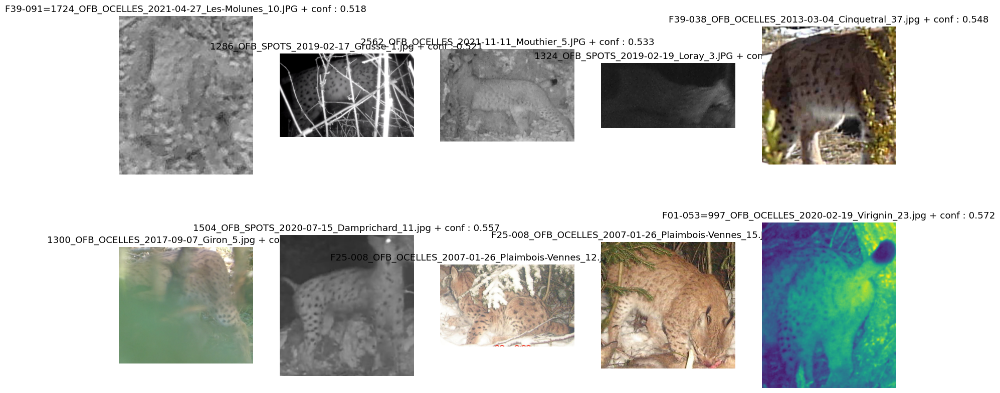

In [56]:
plot_images_conf(df_bbox_france_single_detection, by="smallest")

#### 10 images cropped with the largest confidence are displayed

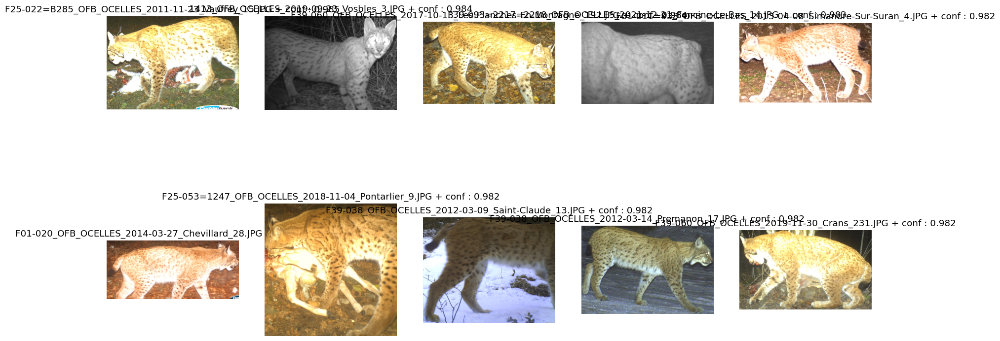

In [57]:
plot_images_conf(df_bbox_france_single_detection, by="largest")

In [58]:
df_france_with_bbox = pd.merge(df_france, df_bbox_france_single_detection[['file', 'conf', 'x', 'y', 'width', 'height']], how='inner', left_on='filepath', right_on='file')
df_france_with_bbox = df_france_with_bbox.drop('file', axis=1)

df_france_with_bbox

,filepath,lynx_id,source,pattern,date,...,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-04-27,...,0.938,854.8416,1054.8000,558.8352,289.0000
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-05-05,...,0.894,906.8544,948.9312,997.7472,1628.8128
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-17,...,0.939,1192.8384,821.8000,743.9040,465.8000
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-16,...,0.965,834.8832,673.8000,594.8640,518.8000
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-05,...,0.970,765.9080,315.9860,568.8540,392.9500
...,...,...,...,...,...,...,...,...,...,...,...
3076,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,...,0.925,668.7360,1152.9216,3805.5744,2295.8208
3077,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,...,0.949,1276.8192,880.9344,3906.6624,2475.8784
3078,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,...,0.902,615.8804,767.9859,1334.8447,828.8511
3079,/gpfsscratch/rech/ads/commun/datasets/extracte...,1017,OFB,SPOTS,2017-08-08,...,0.959,1797.7904,835.8592,470.8928,251.9680


#### Bounding box confidence distribution

<Axes: xlabel='conf', ylabel='Count'>

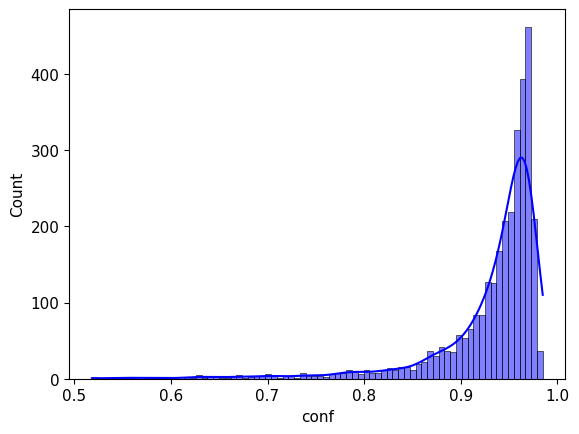

In [59]:
import seaborn as sns

sns.histplot(df_france_with_bbox["conf"], kde=True, color='blue')

#### Compute `image_number` for each individual

This number is no longer the same as initially following filtering, particularly of images with no bounding box detected, for example.

In [60]:
df_france_with_bbox['image_number'] = df_france_with_bbox.groupby('lynx_id').cumcount() + 1
df_france_with_bbox

,filepath,lynx_id,source,pattern,date,...,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-04-27,...,0.938,854.8416,1054.8000,558.8352,289.0000
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-05-05,...,0.894,906.8544,948.9312,997.7472,1628.8128
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-17,...,0.939,1192.8384,821.8000,743.9040,465.8000
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-16,...,0.965,834.8832,673.8000,594.8640,518.8000
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NA,2012-03-05,...,0.970,765.9080,315.9860,568.8540,392.9500
...,...,...,...,...,...,...,...,...,...,...,...
3076,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,...,0.925,668.7360,1152.9216,3805.5744,2295.8208
3077,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,...,0.949,1276.8192,880.9344,3906.6624,2475.8784
3078,/gpfsscratch/rech/ads/commun/datasets/extracte...,679=L192,OFB,SPOTS,2015-07-21,...,0.902,615.8804,767.9859,1334.8447,828.8511
3079,/gpfsscratch/rech/ads/commun/datasets/extracte...,1017,OFB,SPOTS,2017-08-08,...,0.959,1797.7904,835.8592,470.8928,251.9680


In [61]:
df_france_with_bbox.to_csv(DATASET / "france"/ "lynx_dataset_france.csv", index=False)

## **Croatian dataset**

In [62]:
CROATIAN_DATASET_PATH = Path("/gpfsscratch/rech/ads/commun/datasets/extracted/croatia")

In [63]:
df_croatia = pd.read_excel(CROATIAN_DATASET_PATH / "list_of_lynx_photos1.xlsx")
df_croatia

,datum_vrijeme,pouzdanost,broj_zivotinja,broj_mladih,img,...,spol,lokacija,slikana_strana_zivotinje,lat,lon
0,2016-05-19 01:15:00,1,1,0,lynx/photos/RIS.JPG,...,Unknown,POINT (15.439715 44.630702),right,15.439715,44.630702
1,2016-10-22 03:18:00,1,1,0,lynx/photos/PICT0290.JPG,...,M,POINT (14.9107031584 45.2327798187),left,14.910703,45.232780
2,2016-10-23 11:35:00,1,1,0,lynx/photos/PICT0310_GfUlKy6.JPG,...,M,POINT (14.9107031584 45.2327798187),right,14.910703,45.232780
3,2013-12-10 10:21:00,1,1,0,lynx/photos/PICT0236.JPG,...,Unknown,POINT (15.4829004594 44.3279410748),none,15.482900,44.327941
4,2014-09-13 17:49:00,1,1,0,lynx/photos/PICT0001_8J6PCAA.JPG,...,Unknown,POINT (15.4792073827 44.3398982543),left,15.479207,44.339898
...,...,...,...,...,...,...,...,...,...,...,...
2007,2023-05-13 18:06:00,1,1,0,lynx/photos/B1000363.JPG,...,M,POINT (14.949509 45.144032),left,14.949509,45.144032
2008,2022-04-05 05:31:00,1,1,0,lynx/photos/PICT0082_8hHOzSQ.JPG,...,M,POINT (15.043362 44.881497),left,15.043362,44.881497
2009,2023-10-20 06:40:00,1,2,1,lynx/photos/IMG-20231112-WA0007.jpg,...,Unknown,POINT (15.24886 44.828308),left,15.248860,44.828308
2010,2023-10-20 06:40:00,1,2,1,lynx/photos/IMG-20231112-WA0007.jpg,...,Z,POINT (15.24886 44.828308),left,15.248860,44.828308


#### Column renaming

In [64]:
names = {
    "datum_vrijeme": "date",
    "img": "filepath",
    "oznaka": "lynx_id",
    "spol": "sex",
    "lat": "latitude",
    "lon": "longitude",
    "slikana_strana_zivotinje": "side",
    "broj_zivotinja": "number_animals",
    "broj_mladih": "number_children",
    "naziv": "source", # doubt
}

df_croatia.rename(columns=names, inplace=True)
df_croatia

,date,pouzdanost,number_animals,number_children,filepath,...,sex,lokacija,side,latitude,longitude
0,2016-05-19 01:15:00,1,1,0,lynx/photos/RIS.JPG,...,Unknown,POINT (15.439715 44.630702),right,15.439715,44.630702
1,2016-10-22 03:18:00,1,1,0,lynx/photos/PICT0290.JPG,...,M,POINT (14.9107031584 45.2327798187),left,14.910703,45.232780
2,2016-10-23 11:35:00,1,1,0,lynx/photos/PICT0310_GfUlKy6.JPG,...,M,POINT (14.9107031584 45.2327798187),right,14.910703,45.232780
3,2013-12-10 10:21:00,1,1,0,lynx/photos/PICT0236.JPG,...,Unknown,POINT (15.4829004594 44.3279410748),none,15.482900,44.327941
4,2014-09-13 17:49:00,1,1,0,lynx/photos/PICT0001_8J6PCAA.JPG,...,Unknown,POINT (15.4792073827 44.3398982543),left,15.479207,44.339898
...,...,...,...,...,...,...,...,...,...,...,...
2007,2023-05-13 18:06:00,1,1,0,lynx/photos/B1000363.JPG,...,M,POINT (14.949509 45.144032),left,14.949509,45.144032
2008,2022-04-05 05:31:00,1,1,0,lynx/photos/PICT0082_8hHOzSQ.JPG,...,M,POINT (15.043362 44.881497),left,15.043362,44.881497
2009,2023-10-20 06:40:00,1,2,1,lynx/photos/IMG-20231112-WA0007.jpg,...,Unknown,POINT (15.24886 44.828308),left,15.248860,44.828308
2010,2023-10-20 06:40:00,1,2,1,lynx/photos/IMG-20231112-WA0007.jpg,...,Z,POINT (15.24886 44.828308),left,15.248860,44.828308


#### Drop useless columns
- lokacija=localisation : useless because this information is found in latitude and longitude
- pouzdanost=reliability : useless because always the same value (1)
- ime=image : useless because always the same value (Image)

In [65]:
df_croatia.drop(columns=["lokacija", "pouzdanost", "ime"], inplace=True)
df_croatia

,date,number_animals,number_children,filepath,lynx_id,source,sex,side,latitude,longitude
0,2016-05-19 01:15:00,1,0,lynx/photos/RIS.JPG,Varošina 2016,Geonatura d.o.o.,Unknown,right,15.439715,44.630702
1,2016-10-22 03:18:00,1,0,lynx/photos/PICT0290.JPG,Goran ZIP L09,JU Priroda,M,left,14.910703,45.232780
2,2016-10-23 11:35:00,1,0,lynx/photos/PICT0310_GfUlKy6.JPG,Goran ZIP L09,JU Priroda,M,right,14.910703,45.232780
3,2013-12-10 10:21:00,1,0,lynx/photos/PICT0236.JPG,Pakleni,NP Paklenica,Unknown,none,15.482900,44.327941
4,2014-09-13 17:49:00,1,0,lynx/photos/PICT0001_8J6PCAA.JPG,Nik,NP Paklenica,Unknown,left,15.479207,44.339898
...,...,...,...,...,...,...,...,...,...,...
2007,2023-05-13 18:06:00,1,0,lynx/photos/B1000363.JPG,Slavko L35,Veterinarski fakultet,M,left,14.949509,45.144032
2008,2022-04-05 05:31:00,1,0,lynx/photos/PICT0082_8hHOzSQ.JPG,Vilim,PP Velebit,M,left,15.043362,44.881497
2009,2023-10-20 06:40:00,2,1,lynx/photos/IMG-20231112-WA0007.jpg,Crno jezero2 mladunac 2023,Veterinarski fakultet,Unknown,left,15.248860,44.828308
2010,2023-10-20 06:40:00,2,1,lynx/photos/IMG-20231112-WA0007.jpg,Crno jezero 2,Veterinarski fakultet,Z,left,15.248860,44.828308


#### Duplicates

There are no duplicate lines.

In [66]:
df_croatia.duplicated().value_counts()

False    2012
Name: count, dtype: int64

However, some filepaths repeat themselves. **Some images may have several individuals on them. The associated lynx_id are therefore different.**

In [67]:
filepath_value_counts = df_croatia["filepath"].value_counts()
filepath_value_counts[filepath_value_counts != 1]

filepath
lynx/photos/1_5.JPG                               4
lynx/photos/1_27.JPG                              4
lynx/photos/04.12.20_mlad_2_L.png                 3
lynx/photos/04.12.20_mladunac_2_D.png             3
lynx/photos/mlado_1_desno_TONLL9J.png             3
                                                 ..
lynx/photos/19.01.21._golo_trlo_mladunac_1.png    2
lynx/photos/IMAG0019_nFKMlXN.JPG                  2
lynx/photos/PICT0004.JPG                          2
lynx/photos/25_12_2019_both_interaction_2.JPG     2
lynx/photos/PICT0006.JPG                          2
Name: count, Length: 110, dtype: int64

In [68]:
df_croatia[df_croatia["filepath"] == "lynx/photos/1_5.JPG"]

,date,number_animals,number_children,filepath,lynx_id,source,sex,side,latitude,longitude
1715,2023-02-04 18:15:00,4,3,lynx/photos/1_5.JPG,Suzi mladunac3 2022,Rewilding Velebit,Unknown,right,14.958253,44.677339
1716,2023-02-04 18:15:00,4,3,lynx/photos/1_5.JPG,Suzi mladunac2 2022,Rewilding Velebit,Unknown,right,14.958253,44.677339
1717,2023-02-04 18:15:00,4,3,lynx/photos/1_5.JPG,Suzi mladunac1 2022,Rewilding Velebit,Unknown,right,14.958253,44.677339
1718,2023-02-04 18:15:00,4,3,lynx/photos/1_5.JPG,Suzi,Rewilding Velebit,Z,right,14.958253,44.677339


**Note**: it seems complicated to use images with several lynxes in a single image. This is because we don't know which lynx the `lynx_id` refers to in the image.

In [69]:
df_croatia_multiple_animals = df_croatia[df_croatia['number_animals'] > 1]
df_croatia = df_croatia[df_croatia['number_animals'] == 1].copy()

In [70]:
print(len(df_croatia_multiple_animals))
print(len(df_croatia))

305
1707


#### Fix filepath

Checks whether all filepaths currently contain the same prefix

In [71]:
df_croatia["filepath"].str.startswith("lynx/photos/").all()

True

In [72]:
df_croatia["filepath"] = df_croatia["filepath"].str.replace("lynx/photos/", "/gpfsscratch/rech/ads/commun/datasets/extracted/croatia/lynx_pic/")
df_croatia

,date,number_animals,number_children,filepath,lynx_id,source,sex,side,latitude,longitude
0,2016-05-19 01:15:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Varošina 2016,Geonatura d.o.o.,Unknown,right,15.439715,44.630702
1,2016-10-22 03:18:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goran ZIP L09,JU Priroda,M,left,14.910703,45.232780
2,2016-10-23 11:35:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goran ZIP L09,JU Priroda,M,right,14.910703,45.232780
3,2013-12-10 10:21:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Pakleni,NP Paklenica,Unknown,none,15.482900,44.327941
4,2014-09-13 17:49:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nik,NP Paklenica,Unknown,left,15.479207,44.339898
...,...,...,...,...,...,...,...,...,...,...
2005,2023-04-20 00:02:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Slavko L35,Veterinarski fakultet,M,left,14.949509,45.144032
2006,2023-05-11 12:40:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Slavko L35,Veterinarski fakultet,M,left,14.949509,45.144032
2007,2023-05-13 18:06:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Slavko L35,Veterinarski fakultet,M,left,14.949509,45.144032
2008,2022-04-05 05:31:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Vilim,PP Velebit,M,left,15.043362,44.881497


#### Deleting broken images

In [73]:
all_files_exist = all(df_croatia['filepath'].apply(os.path.exists))
all_files_exist

True

#### Date

The dates are already in `datetime64[ns]` format. This is the format used for df_france.

In [74]:
df_croatia.dtypes

date               datetime64[ns]
number_animals              int64
number_children             int64
filepath                   object
lynx_id                    object
source                     object
sex                        object
side                       object
latitude                  float64
longitude                 float64
dtype: object

#### Bounding box detection

In [78]:
croatia_output_megadetector = CROATIAN_DATASET_PATH / "bbox_croatia.json"  # WARNING: change filename if needed

In [79]:
image_filenames = path_utils.find_images(CROATIAN_DATASET_PATH, recursive=True)
len(image_filenames)

1862

In [80]:
results = load_and_run_detector_batch(
    model_file='/gpfswork/rech/ads/commun/megadetector/md_v5a.0.0.pt', 
    image_file_names=image_filenames, 
    quiet=True, 
    include_image_size=True, 
    confidence_threshold=0.5
)

output = write_results_to_file(results, croatia_output_megadetector)

Output file saved at /gpfsscratch/rech/ads/commun/datasets/extracted/croatia/bbox_croatia.json


In [81]:
with open(croatia_output_megadetector, 'r') as f:
    bbox_croatia = json.load(f)

In [82]:
no_bbox_croatia, multiple_bbox_croatia = get_no_and_multiple_bbox(bbox_croatia)

20 images have no bounding boxes detected.
66 images have several bounding boxes detected.
Total: 1862 images.


In [83]:
df_bbox_croatia = flatten_bbox(bbox_croatia, add_image_without_bbox=False)
df_bbox_croatia

,file,im_width,im_height,category,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,2576,1984,1,0.976,0.51510,0.5040,0.48330,0.4637
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,2576,1984,1,0.978,0.37610,0.2525,0.62380,0.6859
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,1245,687,1,0.973,0.54530,0.3566,0.44650,0.6404
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,2576,1984,1,0.969,0.39670,0.4929,0.14940,0.2474
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,1245,681,1,0.957,0.38390,0.2187,0.61600,0.7767
...,...,...,...,...,...,...,...,...,...
1915,/gpfsscratch/rech/ads/commun/datasets/extracte...,1600,1200,1,0.930,0.06499,0.5225,0.31000,0.2074
1916,/gpfsscratch/rech/ads/commun/datasets/extracte...,1600,1200,1,0.882,0.13620,0.5050,0.20180,0.1424
1917,/gpfsscratch/rech/ads/commun/datasets/extracte...,1600,1200,1,0.517,0.53680,0.5650,0.08375,0.1016
1918,/gpfsscratch/rech/ads/commun/datasets/extracte...,1600,1200,1,0.907,0.16430,0.5150,0.21810,0.1899


Absolute coordinates of the bounding box (x, y, width and height) based on the image dimensions

In [84]:
df_bbox_croatia = absolute_coordinates_bbox(df_bbox_croatia)

df_bbox_croatia

,file,im_width,im_height,category,conf,x,y,width,height
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,2576,1984,1,0.976,1326.8976,999.9360,1244.9808,919.9808
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,2576,1984,1,0.978,968.8336,500.9600,1606.9088,1360.8256
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,1245,687,1,0.973,678.8985,244.9842,555.8925,439.9548
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,2576,1984,1,0.969,1021.8992,977.9136,384.8544,490.8416
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,1245,681,1,0.957,477.9555,148.9347,766.9200,528.9327
...,...,...,...,...,...,...,...,...,...
1915,/gpfsscratch/rech/ads/commun/datasets/extracte...,1600,1200,1,0.930,103.9840,627.0000,496.0000,248.8800
1916,/gpfsscratch/rech/ads/commun/datasets/extracte...,1600,1200,1,0.882,217.9200,606.0000,322.8800,170.8800
1917,/gpfsscratch/rech/ads/commun/datasets/extracte...,1600,1200,1,0.517,858.8800,678.0000,134.0000,121.9200
1918,/gpfsscratch/rech/ads/commun/datasets/extracte...,1600,1200,1,0.907,262.8800,618.0000,348.9600,227.8800


#### 10 images cropped with the least confidence are displayed

Only images with a single bounding box are displayed.

In [85]:
df_bbox_croatia_single_detection, df_bbox_croatia_multiple_detections = separate_single_multiple_df(df_bbox_croatia)

print(len(df_bbox_croatia_single_detection), len(df_bbox_croatia_multiple_detections))

1776 144


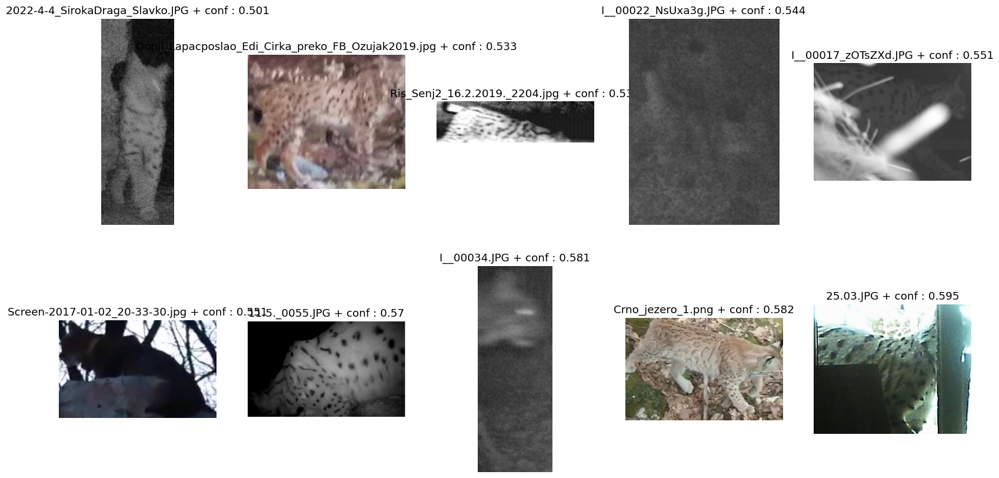

In [86]:
plot_images_conf(df_bbox_croatia_single_detection, by="smallest")

#### 10 images cropped with the largest confidence are displayed

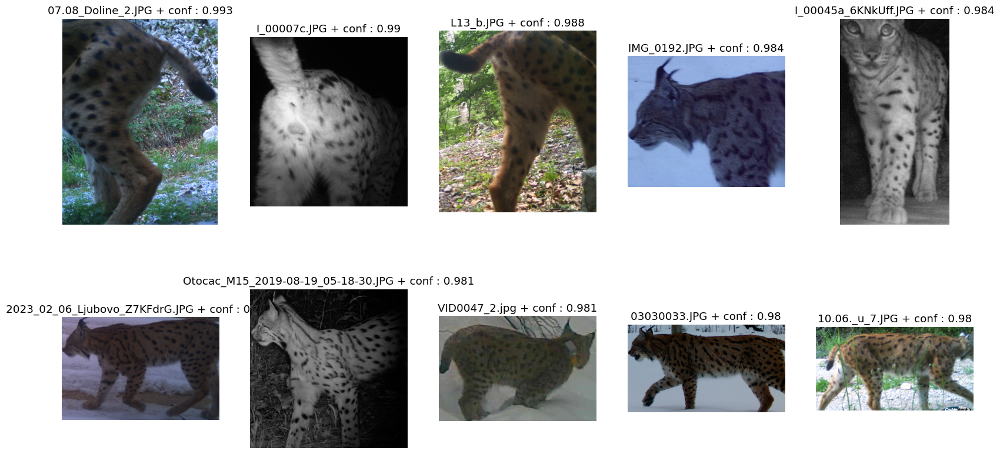

In [87]:
plot_images_conf(df_bbox_croatia_single_detection, by="largest")

In [88]:
df_croatia_with_bbox = pd.merge(df_croatia, df_bbox_croatia_single_detection[['file', 'conf', 'x', 'y', 'width', 'height']], how='inner', left_on='filepath', right_on='file')
df_croatia_with_bbox = df_croatia_with_bbox.drop('file', axis=1)

df_croatia_with_bbox

,date,number_animals,number_children,filepath,lynx_id,...,conf,x,y,width,height
0,2016-05-19 01:15:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Varošina 2016,...,0.932,1068.94080,895.8000,440.8992,272.0000
1,2016-10-22 03:18:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goran ZIP L09,...,0.915,707.94240,645.8496,848.7424,551.8656
2,2016-10-23 11:35:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goran ZIP L09,...,0.944,197.99296,768.9792,1275.9296,761.7984
3,2013-12-10 10:21:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Pakleni,...,0.822,1168.92160,702.8736,626.8416,245.8368
4,2014-09-13 17:49:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nik,...,0.936,1396.73600,874.7904,571.9296,660.8448
...,...,...,...,...,...,...,...,...,...,...,...
1658,2023-04-20 00:02:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Slavko L35,...,0.951,736.00000,483.9600,245.9200,255.9600
1659,2023-05-11 12:40:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Slavko L35,...,0.840,873.92000,438.0000,112.0000,327.0000
1660,2023-05-13 18:06:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Slavko L35,...,0.897,752.96000,486.0000,232.9600,248.8800
1661,2022-04-05 05:31:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Vilim,...,0.952,256.96000,1865.7000,734.8000,773.7000


#### Bounding box confidence distribution

<Axes: xlabel='conf', ylabel='Count'>

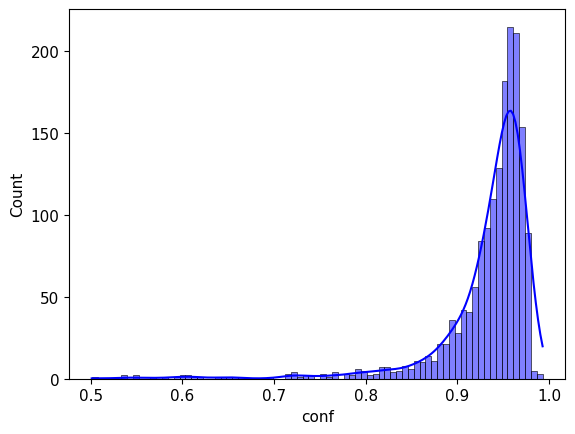

In [89]:
sns.histplot(df_croatia_with_bbox["conf"], kde=True, color='blue')

#### Compute `image_number` for each individual

This number is no longer the same as initially following filtering, particularly of images with no bounding box detected, for example.

In [90]:
df_croatia_with_bbox['image_number'] = df_croatia_with_bbox.groupby('lynx_id').cumcount() + 1
df_croatia_with_bbox

,date,number_animals,number_children,filepath,lynx_id,...,x,y,width,height,image_number
0,2016-05-19 01:15:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Varošina 2016,...,1068.94080,895.8000,440.8992,272.0000,1
1,2016-10-22 03:18:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goran ZIP L09,...,707.94240,645.8496,848.7424,551.8656,1
2,2016-10-23 11:35:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Goran ZIP L09,...,197.99296,768.9792,1275.9296,761.7984,2
3,2013-12-10 10:21:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Pakleni,...,1168.92160,702.8736,626.8416,245.8368,1
4,2014-09-13 17:49:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Nik,...,1396.73600,874.7904,571.9296,660.8448,1
...,...,...,...,...,...,...,...,...,...,...,...
1658,2023-04-20 00:02:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Slavko L35,...,736.00000,483.9600,245.9200,255.9600,57
1659,2023-05-11 12:40:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Slavko L35,...,873.92000,438.0000,112.0000,327.0000,58
1660,2023-05-13 18:06:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Slavko L35,...,752.96000,486.0000,232.9600,248.8800,59
1661,2022-04-05 05:31:00,1,0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Vilim,...,256.96000,1865.7000,734.8000,773.7000,88


In [91]:
df_croatia_with_bbox.to_csv(CROATIAN_DATASET_PATH / "lynx_dataset_croatia.csv", index=False)

## **Merge the dataframes**

In [106]:
# Load them locally
france_dataset = pd.read_csv(DATASET / "france" / "lynx_dataset_france.csv")
croatia_dataset = pd.read_csv(DATASET / "croatia" / "lynx_dataset_croatia.csv")
slovenia_dataset = pd.read_csv(DATASET / "slovenia" / "lynx_dataset_slovenia.csv")
germany_dataset = pd.read_csv(DATASET / "germany" / "lynx_dataset_germany.csv")
# norway_dataset = pd.read_csv(DATASET / "norway" / "lynx_dataset_norway.csv")

print(f"{france_dataset.shape=}")
print(f"{croatia_dataset.shape=}")
print(f"{slovenia_dataset.shape=}")
print(f"{germany_dataset.shape=}")
# print(f"{norway_dataset.shape=}")

france_dataset.shape=(3081, 12)
croatia_dataset.shape=(1663, 16)
slovenia_dataset.shape=(1955, 14)
germany_dataset.shape=(5131, 8)


In [27]:
df_full = pd.concat([france_dataset, croatia_dataset, slovenia_dataset, germany_dataset], ignore_index=True)
df_full

,filepath,lynx_id,source,pattern,date,location,image_number,conf,x,y,width,height,number_animals,number_children,sex,side,latitude,longitude,country
0,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NaN,2012-04-27,NaN,1,0.938,854.8416,1054.8000,558.8352,289.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NaN,2012-05-05,NaN,2,0.894,906.8544,948.9312,997.7472,1628.8128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NaN,2012-03-17,NaN,3,0.939,1192.8384,821.8000,743.9040,465.8000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NaN,2012-03-16,NaN,4,0.965,834.8832,673.8000,594.8640,518.8000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,/gpfsscratch/rech/ads/commun/datasets/extracte...,Van-Gogh,OCS,NaN,2012-03-05,NaN,5,0.970,765.9080,315.9860,568.8540,392.9500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11825,/gpfsscratch/rech/ads/commun/datasets/extracte...,Luha,NaN,NaN,NaN,NaN,7,0.976,0.0000,660.9408,1440.9728,822.9888,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11826,/gpfsscratch/rech/ads/commun/datasets/extracte...,Luha,NaN,NaN,NaN,NaN,8,0.945,706.9696,584.9088,701.8496,396.9024,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11827,/gpfsscratch/rech/ads/commun/datasets/extracte...,B31_Geli_Luna_Juv.13_1,NaN,NaN,NaN,NaN,1,0.977,544.9728,461.8752,833.9456,495.9744,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11828,/gpfsscratch/rech/ads/commun/datasets/extracte...,B266_Juvenil Neu_2013,NaN,NaN,NaN,NaN,1,0.975,552.9600,613.9392,1000.8576,755.8656,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
df_full.to_csv("/gpfsscratch/rech/ads/commun/datasets/extracted/lynx_dataset_full.csv", index=False)

## **Add country information**

In [29]:
data = pd.read_csv(DATASET / "lynx_dataset_full.csv")

In [30]:
def fill_country(filepath):
    if 'france' in filepath.lower():
        return 'France'
    elif 'croatia' in filepath.lower():
        return 'Croatia'
    elif 'slovenia' in filepath.lower():
        return 'Slovenia'
    elif 'germany' in filepath.lower():
        return 'Germany'
    elif 'norway' in filepath.lower():
        return 'Norway'
    else:
        return None

In [31]:
data['country'] = data['filepath'].apply(fill_country)

In [32]:
data['country'].value_counts()

country
Germany     5131
France      3081
Slovenia    1955
Croatia     1663
Name: count, dtype: int64

In [33]:
data.to_csv(DATASET / "lynx_dataset_full.csv", index=False)

## **Remove backgrounds**

Images without backgrounds are calculated using the `Segment Anything Model`. These are saved here: `/gpfsscratch/rech/ads/commun/datasets/extracted/no_background`.  
The csv file is completed with a `filepath_no_bg` column and saved here: `/gpfsscratch/rech/ads/commun/datasets/extracted/lynx_dataset_full_no_bg.csv`

**Images without background don't exist**

- Run `sbatch slurm/sam.slurm` at the root of the project

In [4]:
df_full = pd.read_csv(DATASET / "lynx_dataset_full.csv")

In [8]:
df_full.groupby('country').nunique()[['filepath', 'filepath_no_bg']]

,filepath,filepath_no_bg
country,,
Croatia,1663,1663
France,3081,3081
Germany,5131,5131
Slovenia,1952,1955


In [6]:
all_files_exist = df_full['filepath_no_bg'].apply(lambda x: pd.isna(x) or os.path.exists(x)).all()
assert all_files_exist

### **Check on some images**

In [9]:
from lynx_id.data.dataset import LynxDataset

In [26]:
classic_dataset = LynxDataset(
    dataset_csv = DATASET / "lynx_dataset_full.csv",
    probabilities = [1,0,0]
)

bbox_dataset = LynxDataset(
    dataset_csv = DATASET / "lynx_dataset_full.csv",
    probabilities = [0,1,0]
)

no_bg_dataset = LynxDataset(
    dataset_csv = DATASET / "lynx_dataset_full.csv",
    probabilities = [0,0,1]
)

In [31]:
idx = 11500

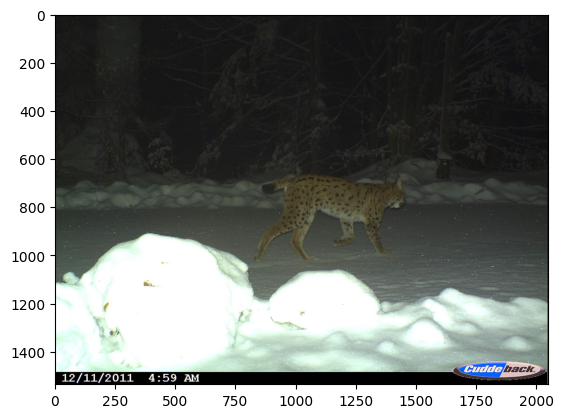

In [32]:
plt.imshow(classic_dataset[idx][0]['image'])

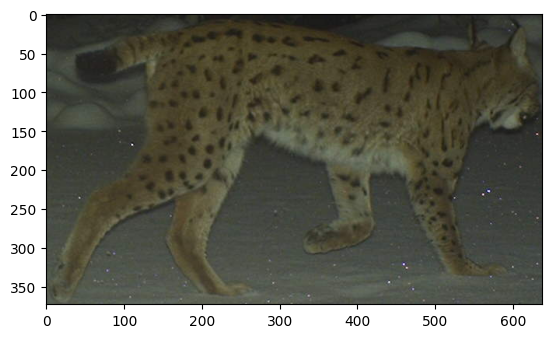

In [33]:
plt.imshow(bbox_dataset[idx][0]['image'])

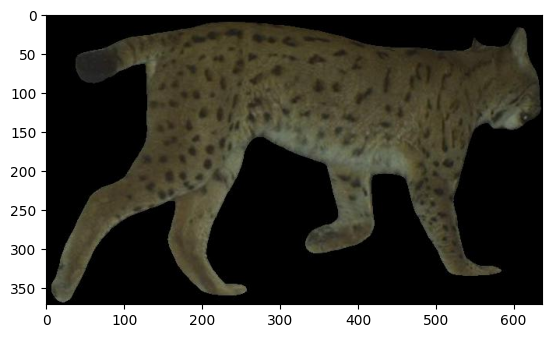

In [34]:
plt.imshow(no_bg_dataset[idx][0]['image'])